In [1]:
! pip install kaggle

! mkdir ~/.kaggle

! cp kaggle.json ~/.kaggle/

! chmod 600 ~/.kaggle/kaggle.json

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
mkdir: cannot create directory ‘/root/.kaggle’: File exists


Downloading Packages

In [2]:
!kaggle datasets download -d leonidkulyk/open-clip-models
!kaggle datasets download -d leonidkulyk/open-clip-wheels
!pip install patool
!pip install transformers
!pip install sentence-transformers
!pip install --no-index --find-links $wheels_path $open_clip_whl_path -q

open-clip-models.zip: Skipping, found more recently modified local copy (use --force to force download)
open-clip-wheels.zip: Skipping, found more recently modified local copy (use --force to force download)
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: You must give at least one requirement to install (maybe you meant "pip install -q"?)


Extracting zip file

In [3]:
import patoolib
patoolib.extract_archive("/content/open-clip-models.zip")
patoolib.extract_archive("/content/open-clip-wheels.zip")


patool: Extracting /content/open-clip-models.zip ...
patool: running /usr/bin/7z x -o./Unpack_vma12o8g -- /content/open-clip-models.zip
patool: ... /content/open-clip-models.zip extracted to `open-clip-models1' (multiple files in root).
patool: Extracting /content/open-clip-wheels.zip ...
patool: running /usr/bin/7z x -o./Unpack_byarlyk0 -- /content/open-clip-wheels.zip
patool: ... /content/open-clip-wheels.zip extracted to `open-clip-wheels' (local file exists).


'open-clip-wheels'

In [4]:
wheels_path = "/content/open_clip_wheels"
open_clip_whl_path = f"{wheels_path}/open_clip_torch-2.14.0-py3-none-any.whl"

Importing Libraries

In [5]:
import os
import sys
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
import transformers
import numpy as np
import pandas as pd
import torch
import open_clip
from scipy import spatial

from sentence_transformers import SentenceTransformer, models


'''sys.path.append('/content/sentence-transformers-222/sentence-transformers')
from sentence_transformers import SentenceTransformer, models'''
comp_path = Path('/content/drive/MyDrive/stable-diffusion-image-to-prompts/')


In [6]:
class CFG:
    device = "cuda"
    seed = 42
    embedding_length = 384
    sentence_model_path = "/content/sentence-transformers-222/all-MiniLM-L6-v2"
    model_name = "coca_ViT-L-14"
    model_checkpoint_path = "/content/open-clip-models/mscoco_finetuned_CoCa-ViT-L-14-laion2B-s13B-b90k.bin"

# Data PreProcessing

In [7]:
df_submission = pd.read_csv(comp_path / 'sample_submission.csv', index_col='imgId_eId')
df_submission.head()

,val
imgId_eId,
20057f34d_0,0.018848
20057f34d_1,0.030190
20057f34d_2,0.072792
20057f34d_3,-0.000673
20057f34d_4,0.016774


In [8]:
images = os.listdir(comp_path / 'images')
imgIds = [i.split('.')[0] for i in images]

eIds = list(range(CFG.embedding_length))

imgId_eId = [
    '_'.join(map(str, i)) for i in zip(
        np.repeat(imgIds, CFG.embedding_length),
        np.tile(range(CFG.embedding_length), len(imgIds)))]

sorted(imgId_eId) == sorted(df_submission.index)

False

Loading Sentence Transformer for Generating Embeddings

In [9]:
st_model = SentenceTransformer('all-MiniLM-L6-v2')

For Plotting Image

In [10]:
def plot_image(image: np.ndarray, title: str) -> None:
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.annotate(
        title, xy=(1.05, 0.5), xycoords='axes fraction',
        ha='left', va='center', fontsize=16, rotation=0, color="#00786b"
    )

# OPEN-CLIP

Loading Coca Model

In [11]:
model1 = open_clip.create_model(CFG.model_name)
open_clip.load_checkpoint(model1, CFG.model_checkpoint_path)

<All keys matched successfully>

In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model1.to(device)
print(device)

cuda


In [13]:
transform = open_clip.image_transform(
    model1.visual.image_size,
    is_train = False,
    mean = getattr(model1.visual, 'image_mean', None),
    std = getattr(model1.visual, 'image_std', None),
)

In [14]:
prompts1 = []

images_path = "/content/drive/MyDrive/stable-diffusion-image-to-prompts/images/"
for image_name in images:
    if((images_path + image_name)!='/content/drive/MyDrive/stable-diffusion-image-to-prompts/images/.ipynb_checkpoints'):
        img = Image.open(images_path + image_name).convert("RGB")
        img = transform(img).unsqueeze(0)


        with torch.no_grad(), torch.cuda.amp.autocast():
            generated = model1.generate(img.to(device))

        prompts1.append(
            open_clip.decode(
                generated[0]
            ).split("<end_of_text>")[0].replace("<start_of_text>", "").rstrip(" .,")
        )

plotting images with generated caption

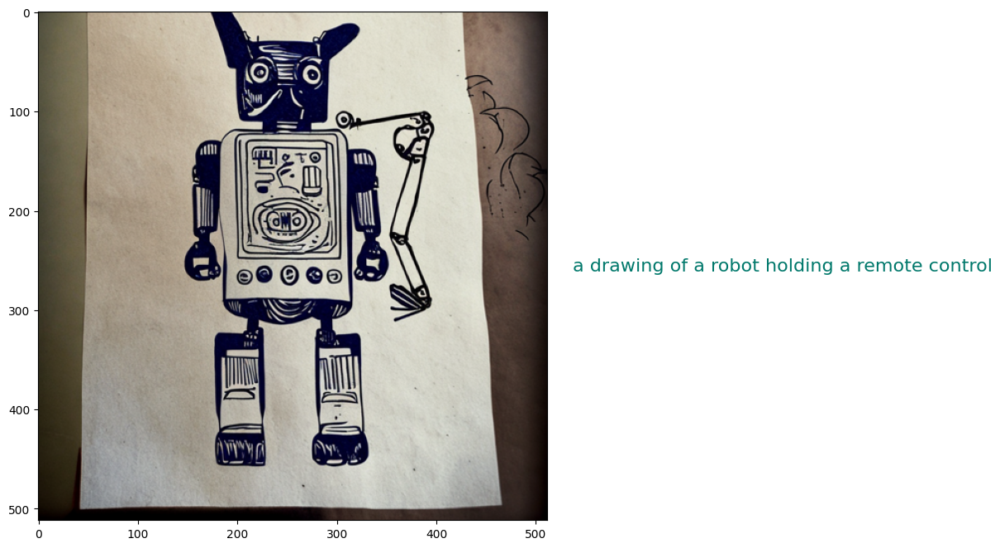

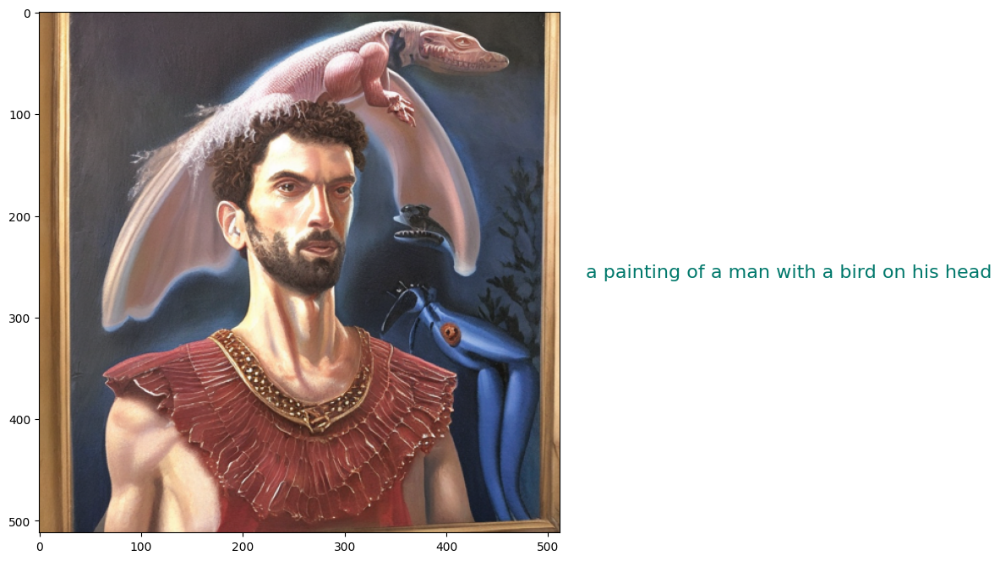

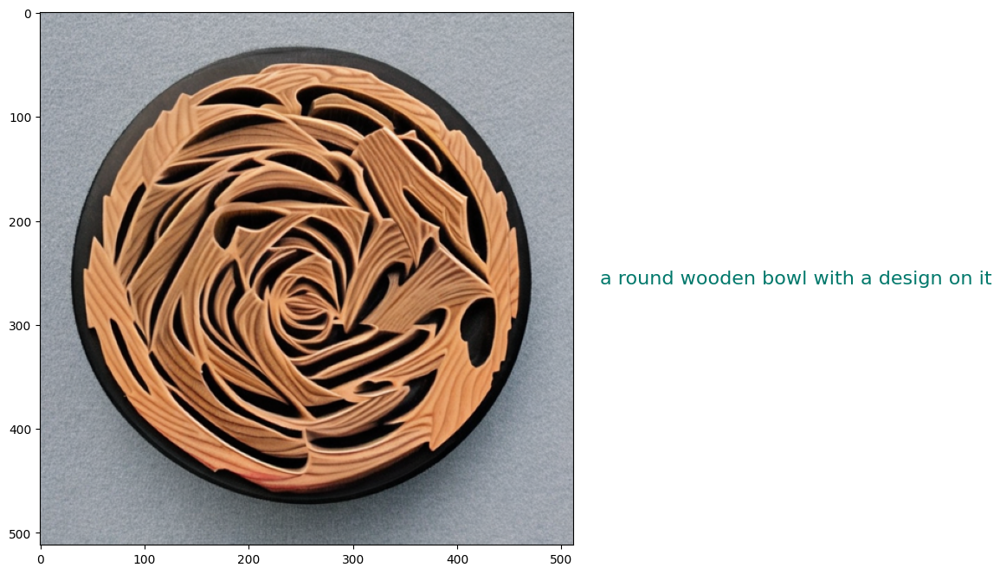

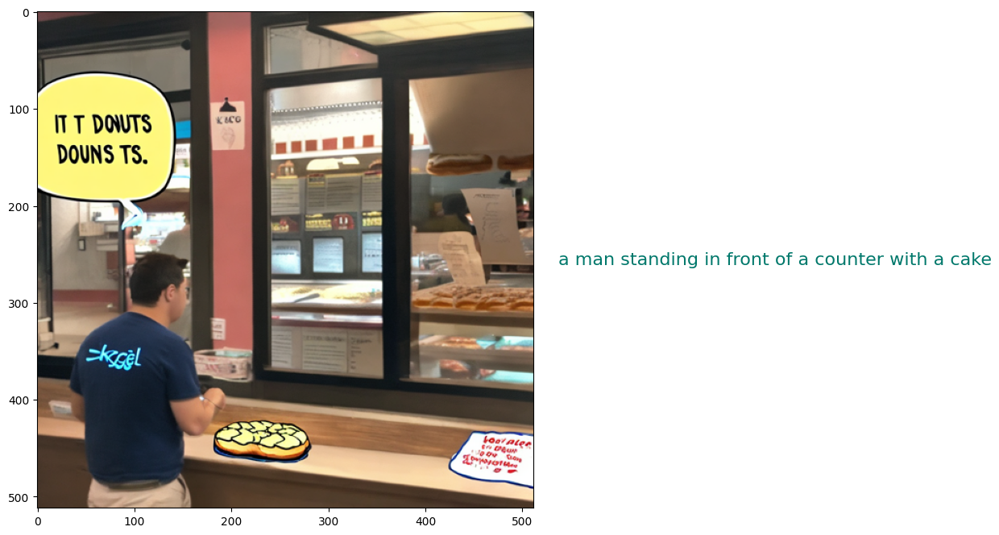

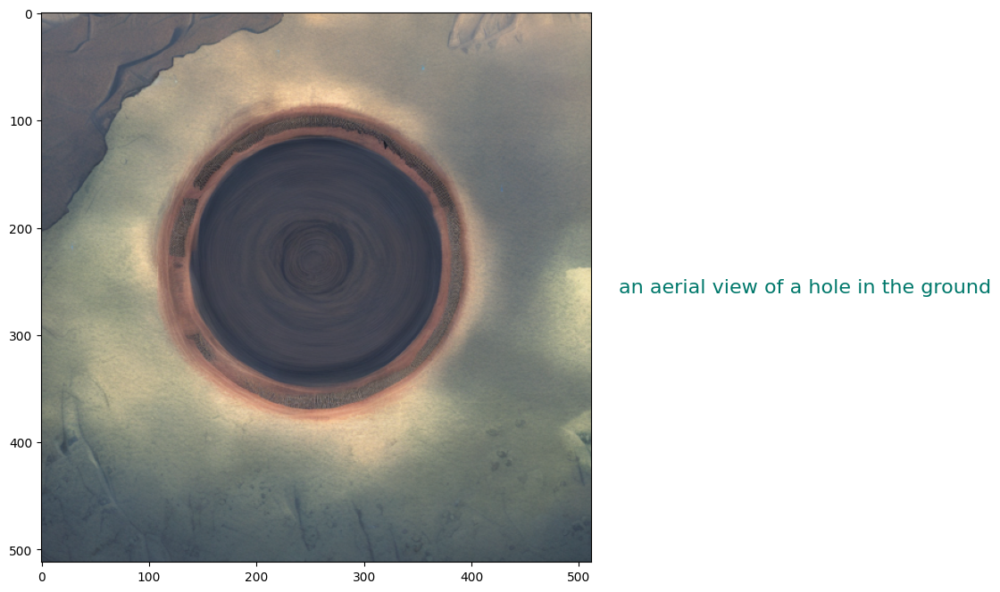

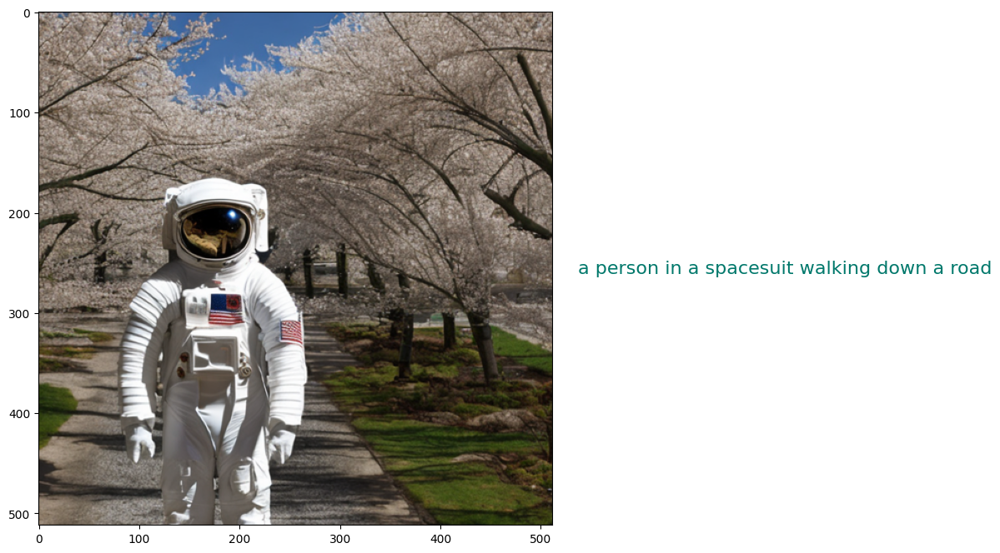

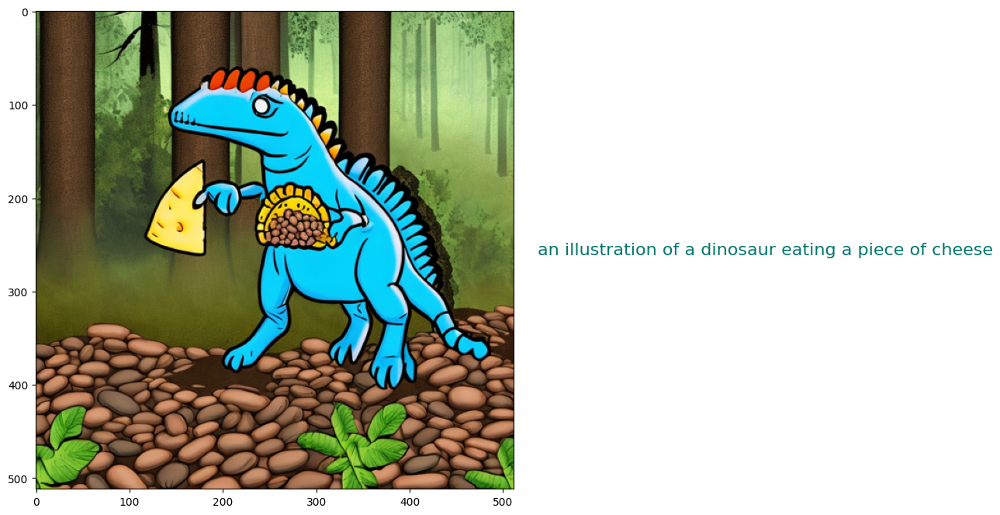

In [15]:
for image_name, prompt in zip(images, prompts1):
    img = Image.open(images_path + image_name).convert("RGB")
    plot_image(img, prompt)

# GIT

In [16]:
from transformers import AutoModelForCausalLM
from transformers import AutoProcessor
processor = AutoProcessor.from_pretrained("microsoft/git-base")
model = AutoModelForCausalLM.from_pretrained("microsoft/git-base")

In [17]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
print(device)

cuda


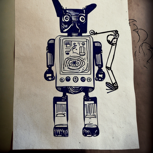

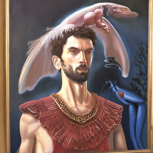

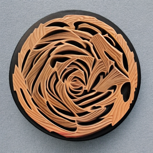

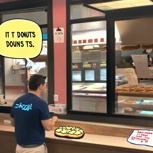

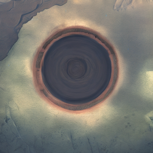

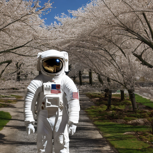

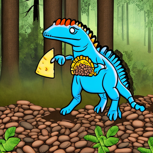

In [18]:
prompts = []

images_path = "/content/drive/MyDrive/stable-diffusion-image-to-prompts/images/"
for image_name in images:
    if((images_path + image_name)!='/content/drive/MyDrive/stable-diffusion-image-to-prompts/images/.ipynb_checkpoints'):
        img = Image.open(images_path + image_name)
        width, height = img.size
        display(img.resize((int(0.3*width), int(0.3*height))))
        #img = Image.open().convert("RGB")
        #img = transform(img).unsqueeze(0)
        inputs = processor(images=img, return_tensors="pt").to(device)
        pixel_values = inputs.pixel_values

        with torch.no_grad(), torch.cuda.amp.autocast():
            generated_ids = model.generate(pixel_values=pixel_values, max_length=384)

        prompts.append(
            processor.batch_decode(generated_ids, skip_special_tokens=True)[0].split("<end_of_text>")[0].replace("<start_of_text>", "").rstrip(" .,")
        )

plotting images with generated caption

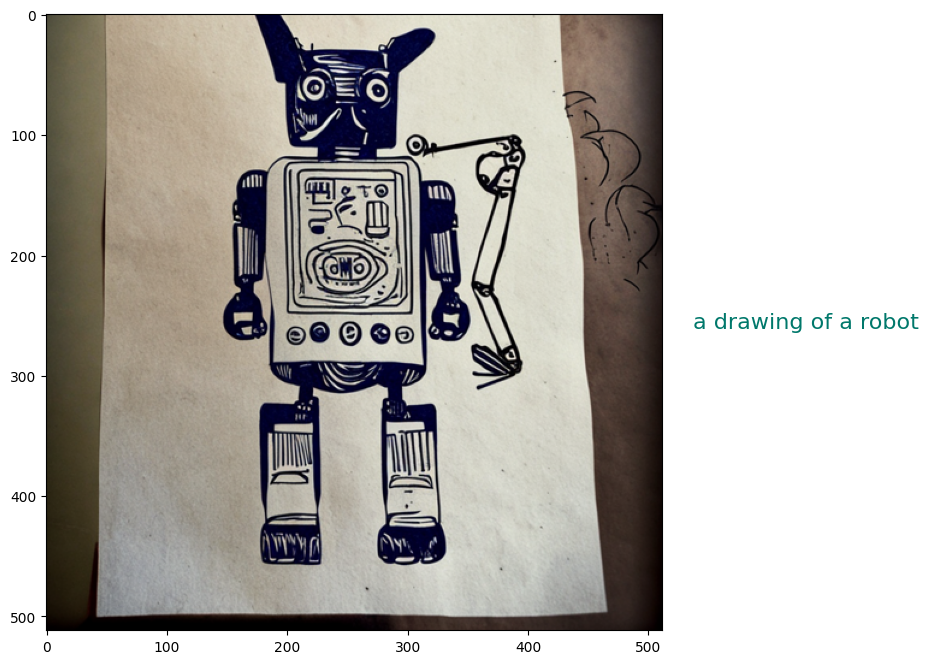

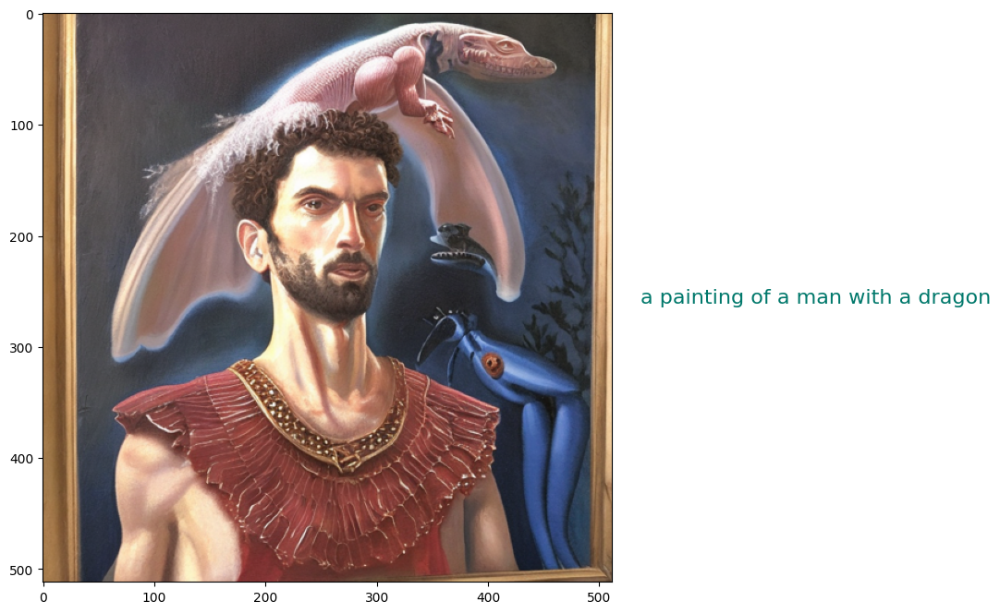

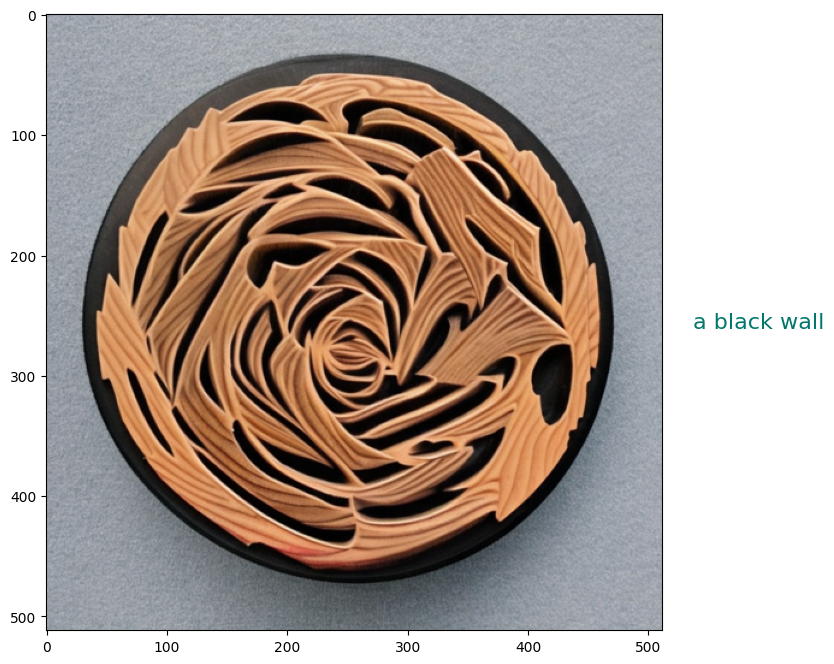

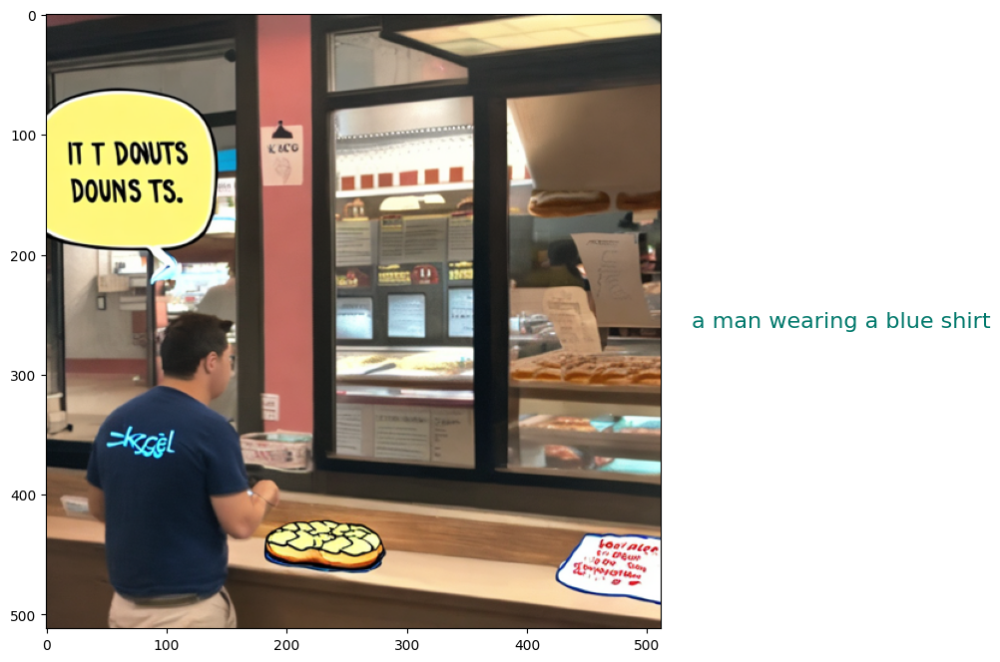

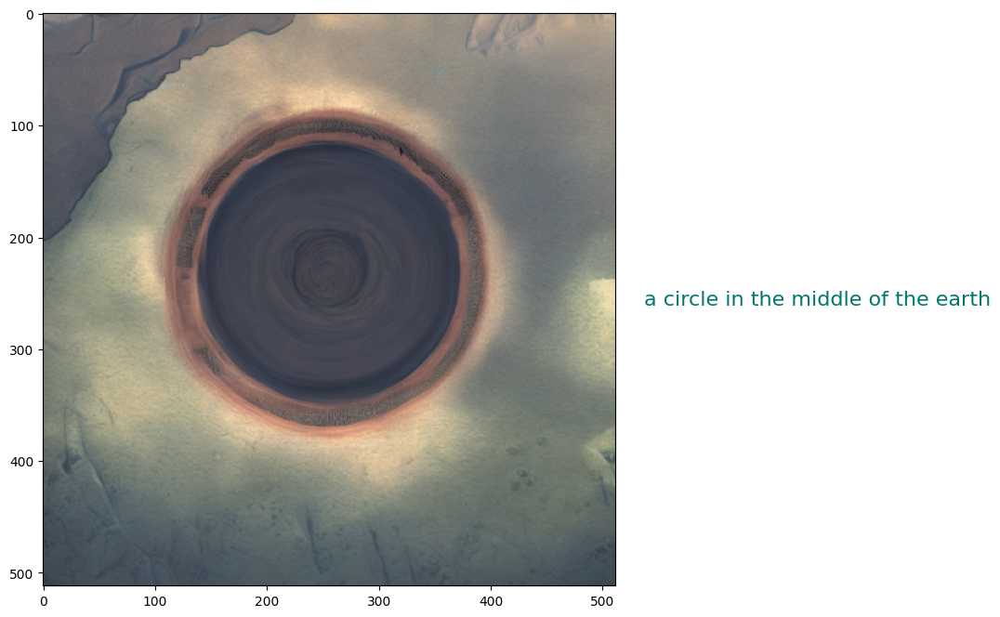

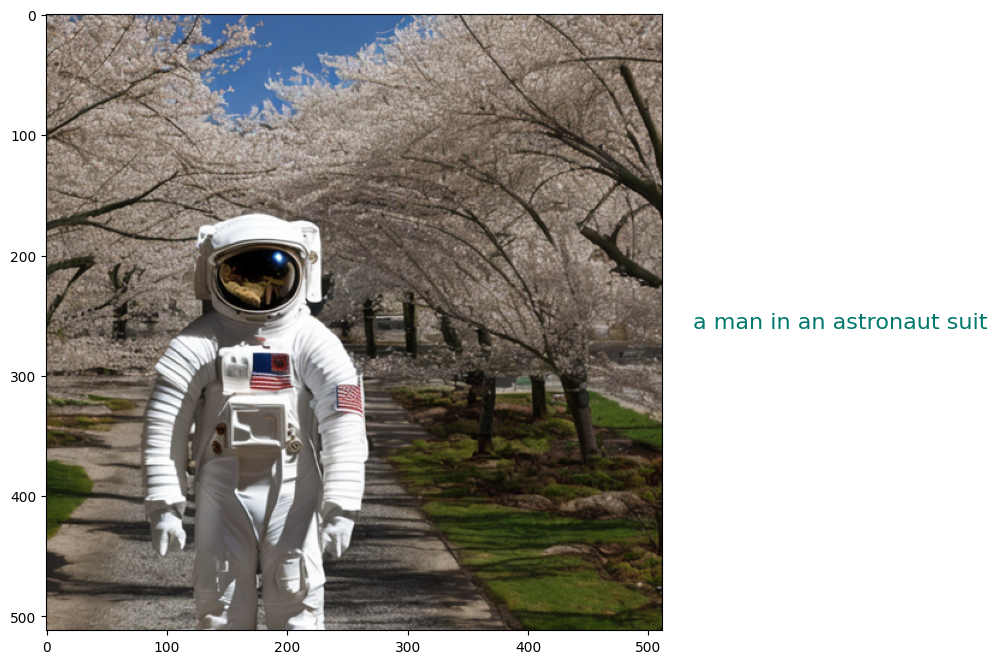

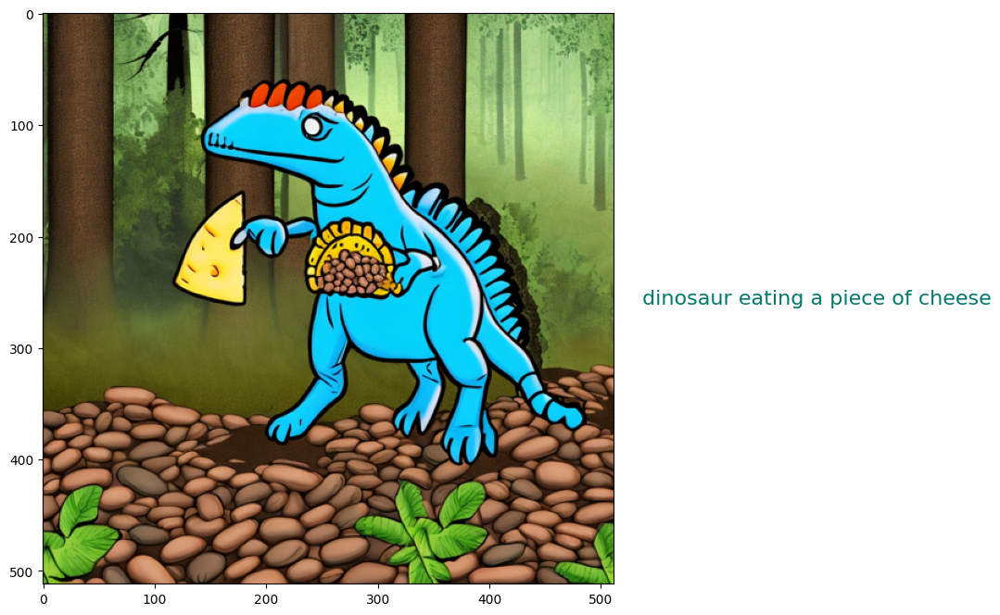

In [19]:
for image_name, prompt in zip(images, prompts):
    img = Image.open(images_path + image_name).convert("RGB")
    plot_image(img, prompt)

# Ensemblings

In [20]:
prompt_embeddings = st_model.encode(prompts).flatten()

In [21]:
prompt_embeddings1= st_model.encode(prompts1).flatten()

In [22]:
prompt_embeddings = prompt_embeddings.reshape(prompt_embeddings1.shape)

In [23]:
prompt_embeddings2=(prompt_embeddings+prompt_embeddings1)/2

# Testing

In [24]:
submission = pd.DataFrame(
    data=prompt_embeddings2,
    columns=['val']
).rename_axis('imgId_eId')

submission.index = imgId_eId[:len(prompt_embeddings2)]

In [25]:
submission.to_csv('submission.csv')

In [26]:
real_prompts = pd.read_csv("/content/drive/MyDrive/stable-diffusion-image-to-prompts/prompts.csv")


In [27]:
real_prompts

,imgId,prompt
0,20057f34d,hyper realistic photo of very friendly and dys...
1,227ef0887,"ramen carved out of fractal rose ebony, in the..."
2,92e911621,ultrasaurus holding a black bean taco in the w...
3,a4e1c55a9,a thundering retro robot crane inks on parchme...
4,c98f79f71,"portrait painting of a shimmering greek hero, ..."
5,d8edf2e40,an astronaut standing on a engaging white rose...
6,f27825b2c,Kaggle employee Phil at a donut shop ordering ...


In [28]:
real_prompt_embeddings = st_model.encode(real_prompts['prompt']).flatten()


In [29]:
EMBEDDING_LENGTH = 384

In [30]:
pred_embeddings = submission['val'].values.reshape(-1, EMBEDDING_LENGTH)


In [31]:
prompt_embeddings = prompt_embeddings.reshape(pred_embeddings.shape)


Similarity Function

In [32]:
def cosine_similarity(y_trues, y_preds):
    scores = [
        1 - spatial.distance.cosine(y_true, y_pred)
        for y_true, y_pred in zip(y_trues, y_preds)
    ]
    return np.mean(scores)

Accuracy of Ensemble Model in Predicting the Actual Prompt Based on Cosine Similarity

In [33]:
 score = cosine_similarity(prompt_embeddings, pred_embeddings)
 print(f'score: {score:.5f}')

score: 0.86708
